# **Segmentation des clients d'un site e-commerce**
*Sofia Chevrolat (Août 2020)*
___
Cette étude en deux notebooks vise à segmenter la base client d'Olist en exploitant leurs données clients anonymisées comportant des informations sur l’historique de commandes, les produits achetés, les commentaires de satisfaction, et la localisation des clients depuis janvier 2017.

___
_**Remerciements**:<br>
Merci à mon compagnon [J. Duplan](https://www.linkedin.com/in/julian-duplan-64844a41/) pour les discussions intéressantes.<br>
Merci également à mon mentor [Samia Drappeau](https://www.linkedin.com/in/samiadrappeau) pour les échanges d'idées, les conseils et les encouragements!_
___

Cette étude est organisée en 2 notebooks: 
- Notebook de nettoyage, feature engineering et analyse exploratoire
- Notebook de modélisation et segmentation

___
## Notebook 2 : Modélisations et segmentation

Ce notebook est organisé comme suit:

**0. Mise en place**
- 0.1 Chargement des librairies et fonctions utiles
- 0.2 Chargement du jeu de données
- 0.3 Préparation des features
    * 0.3.1 Création de features autour des dates de commande
    * 0.3.2 Passage au log
    * 0.3.3. Standardisation

**1. Réduction dimensionnelle**
- 1.1 ACP
    * 1.1.1 Choix du nombre de composantes
    * 1.1.2 Mise en évidence des variables latentes expliquant les données
- 1.2 t-SNE
    * 1.2.1 Projections t-SNE
    * 1.2.2 Projections ACP puis t-SNE
- 1.3 Conclusion

**2. Segmentation**
- 2.1 Choix des critères d'évaluation
- 2.2 Choix de l'algorithme
    * 2.2.1 Choix du nombre de clusters a priori
    * 2.2.2 Comparaison des performances
    * 2.2.3 Conclusion
- 2.3 Exploration des paramètres
    * 2.3.1 Nombre de clusters
        * 2.3.1.1 Méthode du coude
        * 2.3.1.2 Méthode du coefficient moyen de silhouette
        * 2.3.1.3 Tests et comparaisons sur une plage de valeurs de k
    * 2.3.2 Autres paramètres
    * 2.3.3 Conclusion
- 2.4 Exploitation du modèle
    * 2.4.1 Segmentation avec obtention des centroïdes
    * 2.4.2 Détermination des médoïdes
    * 2.4.3 Profil client type par cluster
- 2.5 Étude de la fréquence
    * 2.5.1 Test modèle sur les données 2018
        * 2.5.1.1 Réduction dimensionnelle
        * 2.5.1.2 Segmentation et détermination des médoïdes
        * 2.5.1.3 Profil client type par cluster
    * 2.5.2 Comparaison profil client type 2017 et 2018 par cluster
    * 2.5.3 Conclusion
    
**3. Segmentation finale**
- 3.1 Réduction dimensionnelle : ACP puis t-SNE
- 3.2 Mise en place modèle
    * 3.2.1 Choix du nombre de clusters
        * 3.2.1.1 Dendrogramme
        * 3.2.1.2 Méthode du coude
    * 3.2.2 Optimisation des autres paramètres
- 3.3 Segmentation
    * 3.3.1 Application du modèle
    * 3.3.2 Détermination des médoïdes
    * 3.3.3 Profil client type par cluster
    
**4. Conclusion**

___
### 0. MISE EN PLACE

Dans cette première étape, le cadre de travail est mis en place, c'est-à-dire :
- Les librairies et packages Python nécessaires sont chargés
- Les fonctions utiles sont définies
- Le jeu de données est chargé
___

___
#### 0.1 CHARGEMENT DES LIBRAIRIES ET FONCTIONS UTILES

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import (preprocessing,
                     manifold,
                     decomposition)
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import pairwise_distances_argmin_min
import seaborn as sns
import scipy.cluster.hierarchy as shc

In [6]:
from sys import path
path.append("./Resources/functions")

import helper_functions as hf
import graphical_functions as gf

**_N.B : Le code des fonctions implémentées dans helper_functions dans le cadre de cette étude est également disponible en fin de notebook, section "Annexes"_**
___
#### 0.2 CHARGEMENT DU JEU DE DONNÉES

In [7]:
customer_data_2017 = pd.read_csv("./Resources/datasets/customer_data_2017-cleaned.csv",
                                 sep=",").iloc[:, 1:]

In [8]:
customer_data_2018 = pd.read_csv("./Resources/datasets/customer_data_2018-cleaned.csv",
                                 sep=",").iloc[:, 1:]

In [9]:
customer_data = pd.concat([customer_data_2017.assign(year=2017),
                           customer_data_2018.assign(year=2018)])

___
#### 0.3 PRÉPARATIONS DES FEATURES

___
##### 0.3.1 Sélection de features

On n'enlève les features qualitatives et de date qui ont été encodées.

In [10]:
data = customer_data.drop(columns=["customer_id",
                                   "payment_type",
                                   "product_category_name",
                                   "customer_city",
                                   "customer_state",
                                   "first_order_date",
                                   "last_order_date"])

___
##### 0.3.2 Passage au log

On crée une version standardisée des données, certains modèles donnant de meilleurs résultats sur les données standardisées.

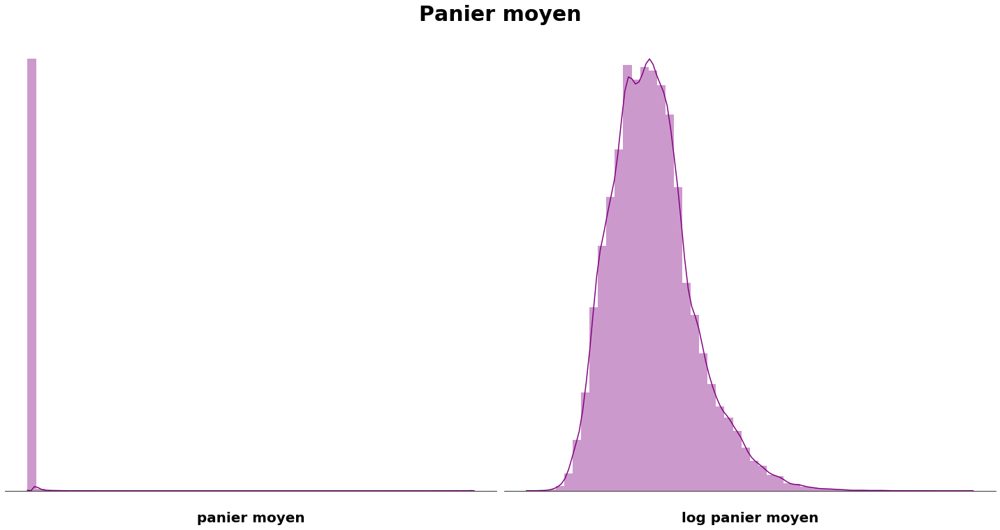

In [11]:
gf.plot_2_distplots(data["average_basket"], "panier moyen",
                    np.log(data["average_basket"]), "log panier moyen",
                    20, 10, "Panier moyen")

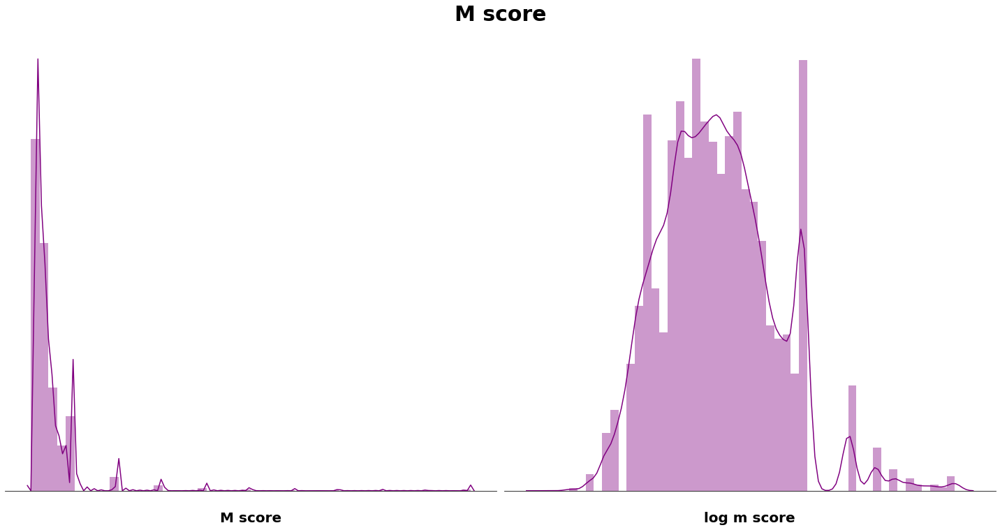

In [12]:
gf.plot_2_distplots(data["M_score"], "M score",
                    np.log(data["M_score"]), "log m score",
                    20, 10, "M score")

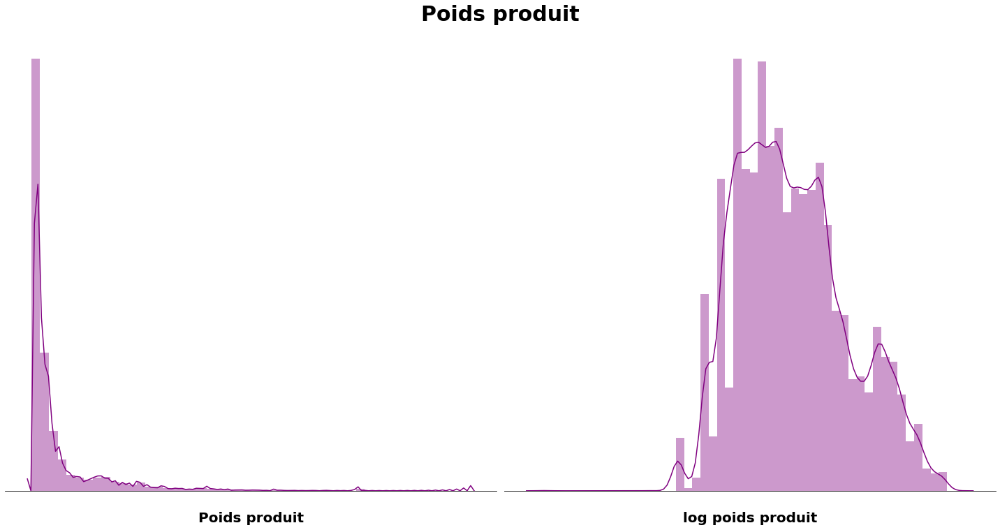

In [13]:
gf.plot_2_distplots(data["product_weight_g"], "Poids produit",
                    np.log(data["product_weight_g"]), "log poids produit",
                    20, 10, "Poids produit")

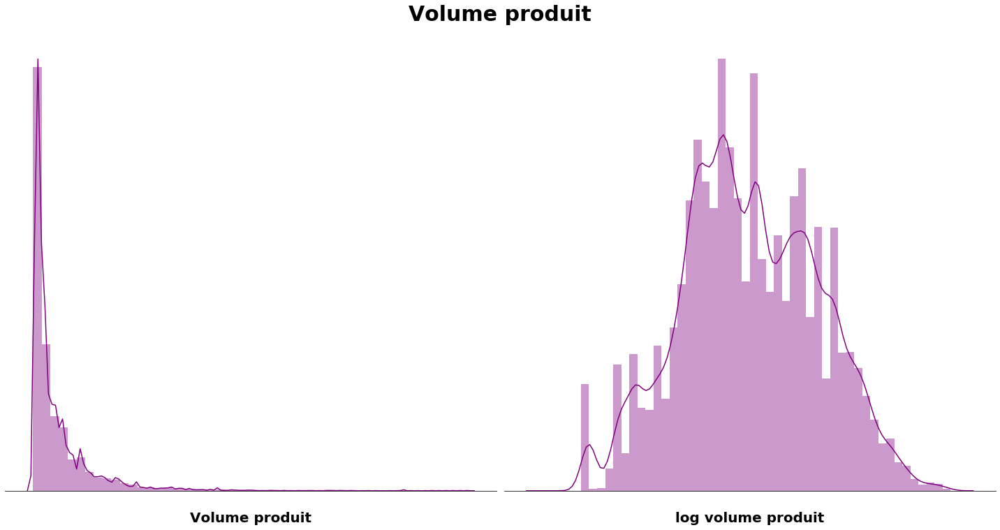

In [14]:
gf.plot_2_distplots(data["product_volume_cm3"], "Volume produit",
                    np.log(data["product_volume_cm3"]), "log volume produit",
                    20, 10, "Volume produit")

In [15]:
data["average_basket"] = np.log(data["average_basket"])
data["M_score"] = np.log(data["M_score"])
data["product_volume_cm3"] = np.log(data["product_volume_cm3"])
data["product_weight_g"] = np.log(data["product_weight_g"])

___
##### 0.3.3 Standardisation

In [16]:
data_2017 = data[data["year"] == 2017].drop(columns="year")
data_2018 = data[data["year"] == 2018].drop(columns="year")

In [17]:
# Standardisation
data_2017_scaled = preprocessing.StandardScaler().fit_transform(data_2017)
data_2018_scaled = preprocessing.StandardScaler().fit_transform(data_2018)
data_scaled = preprocessing.StandardScaler().fit_transform(data)

____
### 1. RÉDUCTION DIMENSIONNELLE

___
#### 1.1 ACP

___
##### 1.1.1 Choix du nombre de composantes

In [21]:
N_COMPONENTS = 20

In [22]:
pca = decomposition.PCA(n_components=N_COMPONENTS)
pca_results = pca.fit_transform(data_2017_scaled)

In [24]:
print('Explained variation per principal component: {}'\
      .format(pca.explained_variance_ratio_))

print('Cumulative explained variation for {} principal components: {}'\
      .format(N_COMPONENTS, np.sum(pca.explained_variance_ratio_)))

Explained variation per principal component: [0.08624287 0.07164523 0.06679051 0.05589897 0.04906199 0.04800958
 0.0472947  0.04556147 0.04528228 0.04133851 0.03443921 0.03360606
 0.03254015 0.02671162 0.02571596 0.02413024 0.02358883 0.022021
 0.02117858 0.02073398]
Cumulative explained variation for 20 principal components: 0.8217917428214232


**Éboulis des valeurs propres**

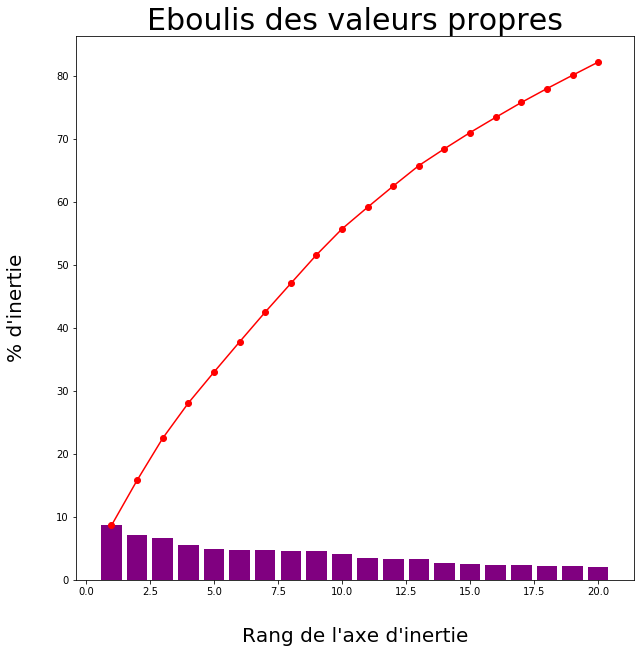

In [42]:
gf.display_scree_plot(pca)

Au total, ces 20 composantes expliquent plus de 80% de la variance observées dans les données, en utilisant donc moins de la moitié des dimensions initiales.

___
##### 1.3.4 Mise en évidence variables latentes expliquant les données

Les 6 premiers axes représentent plus de 30% de la variation totale. 

Regardons cela plus en détails afin de voir s'il est possible de trouver des variables latentes qui pourraient expliquer les données:

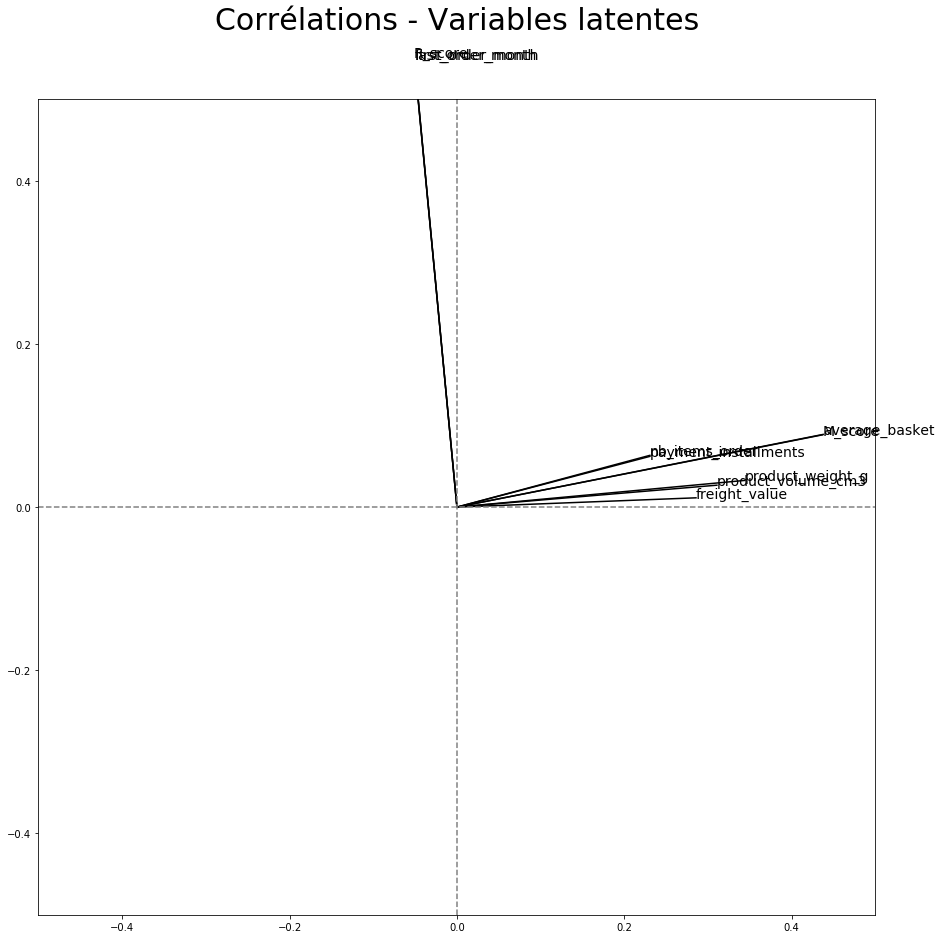

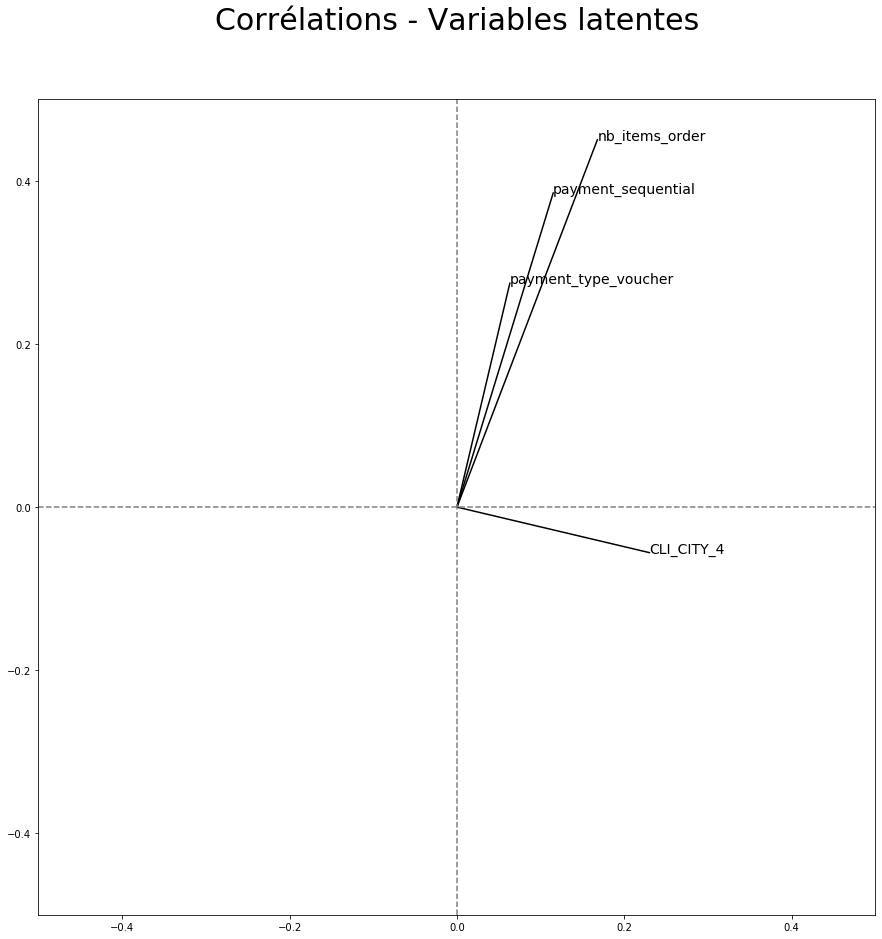

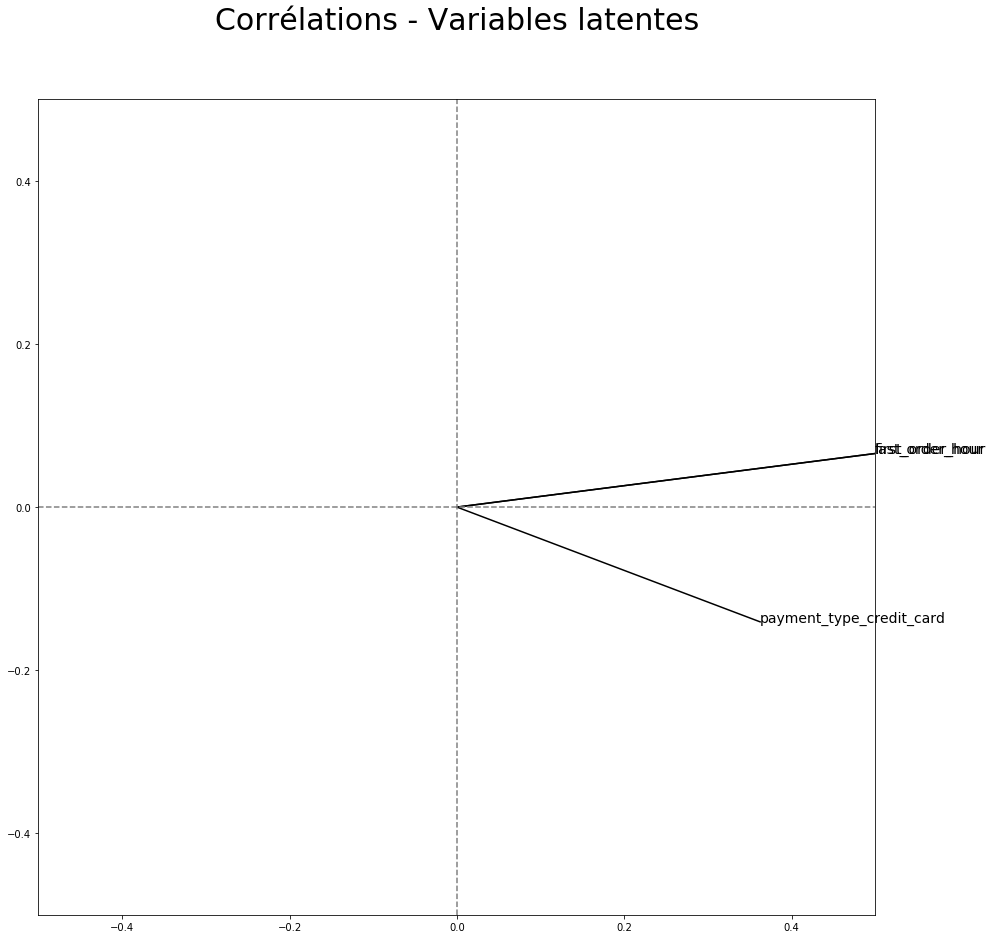

In [81]:
gf.plot_correlation_circle(pca.components_, data_2017, 15, 15)

Les variables qui ressortent sont :
- 1ère composante :
    * Les dimensions produits 
    * Les coûts (panier moyen et frais de port)
- 2ème composante :
    * Le mois de commande
- 3ème composante : 
    * La ville 
- 4ème composante : 
    * Le nombre d'articles par commande
    * Le nombre de paiements 
    * Le nombre de moyens de paiement
- 5ème composante :
    * L'heure de commande
- 6ème composante :
    * Le paiement par carte de crédit

___
#### 1.2 t-SNE

___
##### _<u>1.2.1 Seul</u>_

In [30]:
time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_2017_scaled)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 41083 samples in 2.517s...
[t-SNE] Computed neighbors for 41083 samples in 184.673s...
[t-SNE] Computed conditional probabilities for sample 1000 / 41083
[t-SNE] Computed conditional probabilities for sample 2000 / 41083
[t-SNE] Computed conditional probabilities for sample 3000 / 41083
[t-SNE] Computed conditional probabilities for sample 4000 / 41083
[t-SNE] Computed conditional probabilities for sample 5000 / 41083
[t-SNE] Computed conditional probabilities for sample 6000 / 41083
[t-SNE] Computed conditional probabilities for sample 7000 / 41083
[t-SNE] Computed conditional probabilities for sample 8000 / 41083
[t-SNE] Computed conditional probabilities for sample 9000 / 41083
[t-SNE] Computed conditional probabilities for sample 10000 / 41083
[t-SNE] Computed conditional probabilities for sample 11000 / 41083
[t-SNE] Computed conditional probabilities for sample 12000 / 41083
[t-SNE] Computed conditional probabilities for 

Text(0, 0.5, 't-SNE 2')

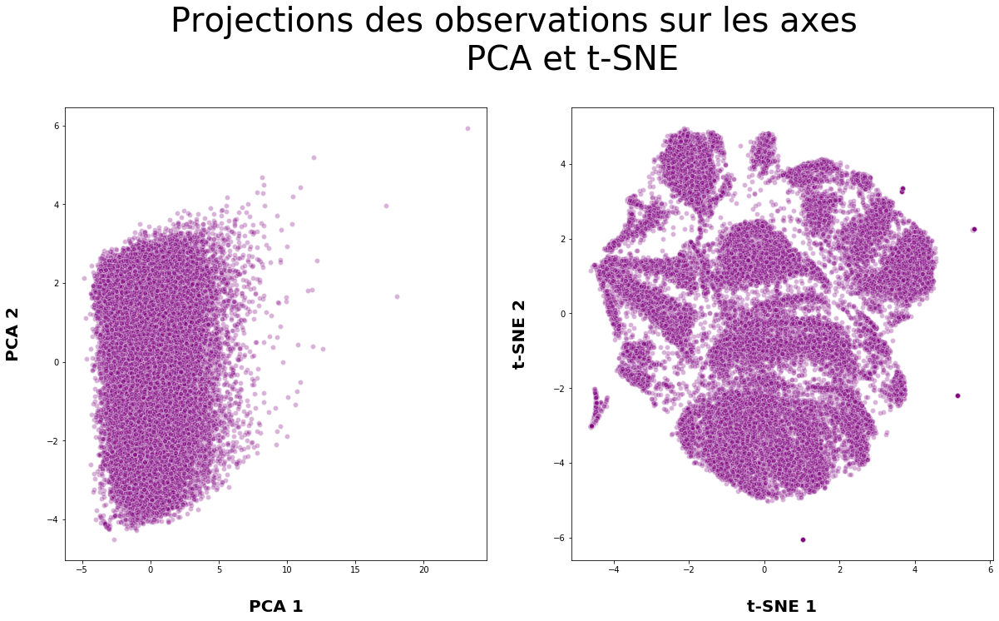

In [101]:
data_to_plot = pd.DataFrame()
data_to_plot["pca-one"] = pca_results[:,0]
data_to_plot["pca-two"] = pca_results[:,1]
data_to_plot["tsne-2d-one"] = tsne_results[:,0]
data_to_plot["tsne-2d-two"] = tsne_results[:,1]


TITLE_SIZE = 40
TITLE_PAD = 1.05
LABEL_SIZE = 30
LABEL_PAD = 20

f, (ax1, ax2) = plt.subplots(ncols=2,
                             sharey=False,
                             figsize=(20, 10))

f.suptitle("Projections des observations sur les axes\n\
           PCA et t-SNE", fontsize=TITLE_SIZE, y=TITLE_PAD)

ax1 = plt.subplot(1, 2, 1)

handle_plot_1 = sns.scatterplot(x="pca-one", y="pca-two",
                                data=data_to_plot,
                                legend="full",
                                alpha=0.3,
                                ax=ax1)

handle_plot_1.set_xlabel("PCA 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_1.set_ylabel("PCA 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")


ax2 = plt.subplot(1, 2, 2)
handle_plot_2 = sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two",
                                data=data_to_plot,
                                legend="full",
                                alpha=0.3,
                                ax=ax2)

handle_plot_2.set_xlabel("t-SNE 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_2.set_ylabel("t-SNE 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

___
##### _<u>1.2.2 t-SNE avec ACP préalable</u>_

Initialiser l’algorithme t-SNE par une PCA avant de le lancer, ce qui permet de conserver de base un peu plus de la structure globale

In [33]:
N_COMPONENTS = 20

In [34]:
pca = decomposition.PCA(n_components=N_COMPONENTS)
pca_results = pca.fit_transform(data_2017_scaled)

print('Cumulative explained variation for {} principal components: {}'\
      .format(N_COMPONENTS, np.sum(pca.explained_variance_ratio_)))

Cumulative explained variation for 20 principal components: 0.8219881097557794


In [35]:
time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_results)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 41083 samples in 0.083s...
[t-SNE] Computed neighbors for 41083 samples in 94.641s...
[t-SNE] Computed conditional probabilities for sample 1000 / 41083
[t-SNE] Computed conditional probabilities for sample 2000 / 41083
[t-SNE] Computed conditional probabilities for sample 3000 / 41083
[t-SNE] Computed conditional probabilities for sample 4000 / 41083
[t-SNE] Computed conditional probabilities for sample 5000 / 41083
[t-SNE] Computed conditional probabilities for sample 6000 / 41083
[t-SNE] Computed conditional probabilities for sample 7000 / 41083
[t-SNE] Computed conditional probabilities for sample 8000 / 41083
[t-SNE] Computed conditional probabilities for sample 9000 / 41083
[t-SNE] Computed conditional probabilities for sample 10000 / 41083
[t-SNE] Computed conditional probabilities for sample 11000 / 41083
[t-SNE] Computed conditional probabilities for sample 12000 / 41083
[t-SNE] Computed conditional probabilities for s

In [ ]:
data_to_plot['tsne-pca-one'] = tsne_pca_results[:, 0]
data_to_plot['tsne-pca-two'] = tsne_pca_results[:, 1]

Text(0, 0.5, 'PCA-t-SNE 2')

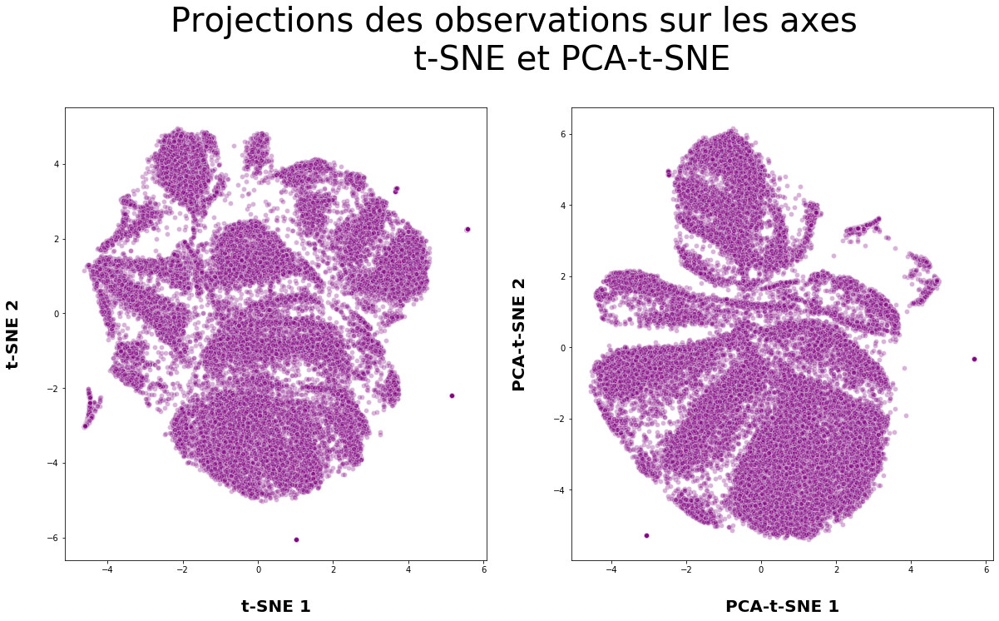

In [102]:
TITLE_SIZE = 40
TITLE_PAD = 1.05

f, (ax1, ax2) = plt.subplots(ncols=2,
                             sharey=False,
                             figsize=(20, 10))

f.suptitle("Projections des observations sur les axes\n\
           t-SNE et PCA-t-SNE", fontsize=TITLE_SIZE, y=TITLE_PAD)

ax1 = plt.subplot(1, 2, 1)

handle_plot_1 = sns.scatterplot(x="tsne-2d-one", y="tsne-2d-two",
                                data=data_to_plot,
                                legend="full",
                                alpha=0.3,
                                ax=ax1)

handle_plot_1.set_xlabel("t-SNE 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_1.set_ylabel("t-SNE 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")


ax2 = plt.subplot(1, 2, 2)
handle_plot_2 = sns.scatterplot(x="tsne-pca-one", y="tsne-pca-two",
                                data=data_to_plot,
                                legend="full",
                                alpha=0.3,
                                ax=ax2)

handle_plot_2.set_xlabel("PCA-t-SNE 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_2.set_ylabel("PCA-t-SNE 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

___
#### 1.3 CONCLUSION

On peut restreindre les features aux 20 features principales qui comptent pour 80% de la variance.

La visusalisation t-SNE associée à l'ACP permet de voir des groupes se détacher faiblement les uns des autres, de façon plus distincte que la t-SNE seule.

____
### 2. 1ÈRE SEGMENTATION AVEC ÉTUDE FRÉQUENCE

___
#### 2.1 CHOIX DES CRITÈRES D'ÉVALUATION

- Forme des clusters
    * resserrés sur eux-mêmes (homogénéité)
    * loin les uns des autres (séparation) 
> Coefficient de silhouette compris en [-1;1] => pour evaluer un clustering, on peut calculer le coefficient de silhouette moyen.

- Stabilité des clusters
> Indice de Rand ajusté calculé et comparé pour chaque nouveau clustering effectué.

- Compatibilité avec des connaissances spécifiques au domaine

____
#### 2.2 CHOIX DE L'ALGORITHME

In [231]:
data_model = data_to_plot[["tsne-pca-one", "tsne-pca-two"]].copy()

___
##### _<u>2.2.1 Instantiation et paramétrage des algorithmes de test</u>_

In [104]:
# For reproducability of the results
N = 20000
np.random.seed(42)
rndperm = np.random.permutation(data_2017_scaled.shape[0])
data_subset = data_model.loc[rndperm[:N], :].copy()

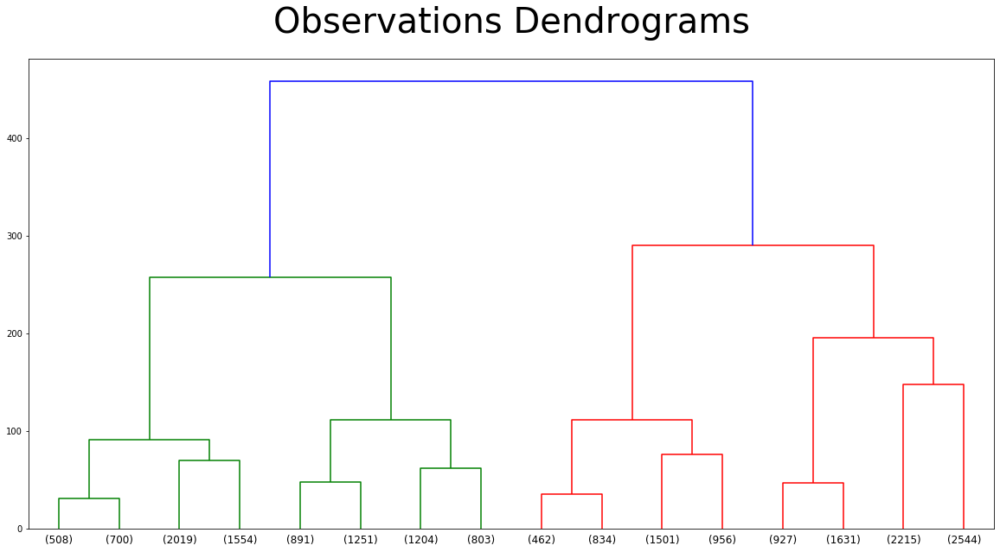

In [109]:
plt.figure(figsize=(20, 10))
plt.title("Observations Dendrograms", fontsize=40, pad=30)
dend = shc.dendrogram(shc.linkage(data_subset, method='ward'),
                      truncate_mode="level", p=3)

Le dendrogramme nous permet de choisir 4 clusters a priori.

In [110]:
N_CLUSTERS = 4

___
##### _<u>2.2.2 Comparaison des performances</u>_

On va comparer les performances de plusieurs algorithmes aux propriétés différentes :
- Baseline : Assigning random clusters
- Clustering hiérarchique : [Agglomerative Clustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)
- KMeans
- DBSCAN

In [111]:
algos = {"Dummy": N_CLUSTERS,
         "Hierarchy":AgglomerativeClustering(n_clusters=N_CLUSTERS),
         "KMeans": KMeans(n_clusters=N_CLUSTERS),
         "DBSCAN":DBSCAN()}

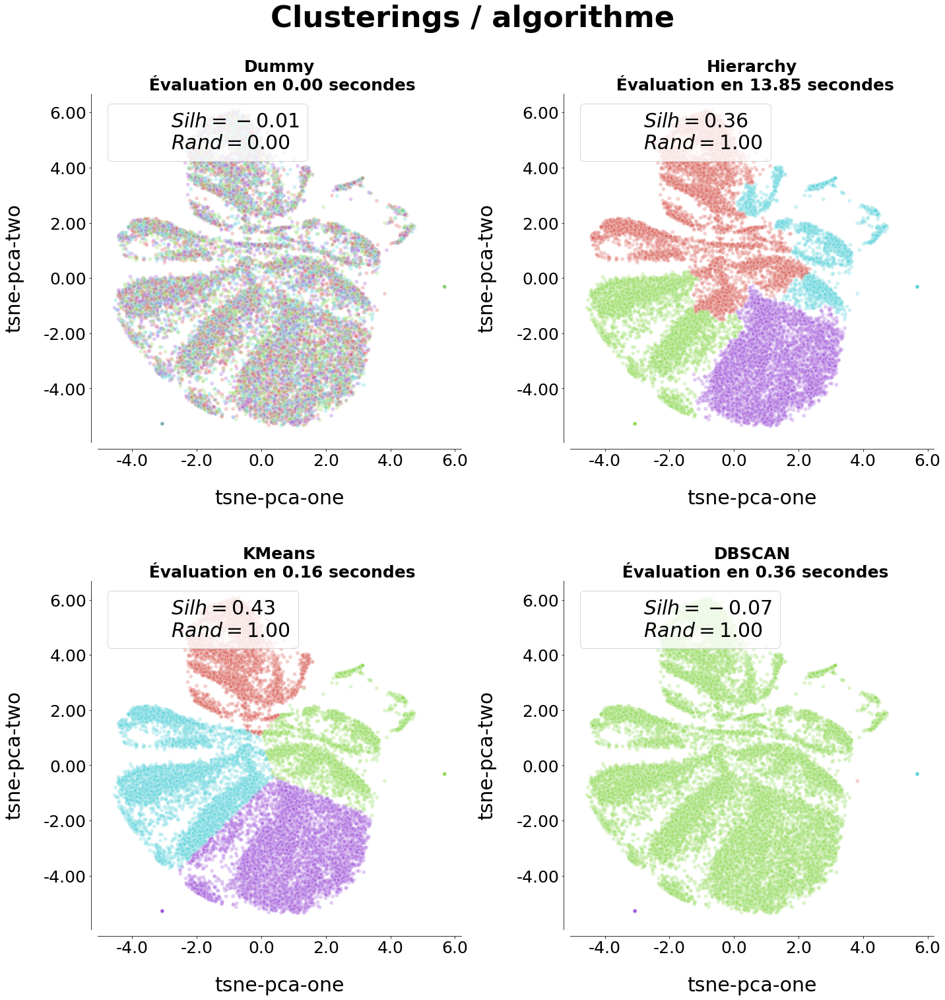

In [112]:
scores = hf.fit_plot(algos, data_subset, 20, 20, "Clusterings / algorithme")

Les différents algorithmes donnent les résultats suivants :

In [113]:
scores.sort_values(["silhouette", "Rand", "Time"], ascending=False)

,Algorithme,iter,silhouette,Rand,Nb Clusters,Time
7,KMeans,1,0.431516,0.997259,4,0.163943
8,KMeans,2,0.431476,0.998465,4,0.163943
6,KMeans,0,0.431465,0.998533,4,0.163943
3,Hierarchy,0,0.360432,1.000000,4,13.854574
4,Hierarchy,1,0.360432,1.000000,4,13.854574
5,Hierarchy,2,0.360432,1.000000,4,13.854574
0,Dummy,0,-0.003868,0.000105,4,0.000114
2,Dummy,2,-0.005256,0.000189,4,0.000114
1,Dummy,1,-0.006306,0.000096,4,0.000114
9,DBSCAN,0,-0.073566,1.000000,4,0.355321


À l'exception de l'algorithme DBSCAN, les algorithmes semblent globalement trouver les mêmes clusters, avec des coefficients de silhouette largement positifs et un coefficient de Rand indiquant une bonne stabilité des clusters.

___
##### _<u>2.2.3 Conclusion : choix de l'algorithme</u>_

L'algorithme le plus rapide, créant les clusters les plus nets et possédant le meilleur coefficient de silhouette est celui du K-means.

> **L'algorithme de Kmeans donne les meilleurs résultats.**

___
#### 2.3 EXPLORATION DES PARAMÈTRES

___
##### _<u>2.3.1 Nombre de clusters</u>_

On va tenter d'améliorer les performances de l'algorithme en recherchant le K optimal plus finement à l'aide de la méthode dite du coude.

Étant donné que la finalité est de pouvoir créer des groupes clients exploitables par une équipe marketing, nous n'allons pas chercher à tester un nombre de clusters supérieur à 10.

In [114]:
Sum_of_squared_distances = []
Average_silhouette_scores = []


K = range(2, 11)

for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_model)

    Sum_of_squared_distances.append(km.inertia_)

    Average_silhouette_scores.append(silhouette_score(data_model,
                                                      km.labels_,
                                                      metric="euclidean"))

___
###### 2.3.1.1 Méthode du coude

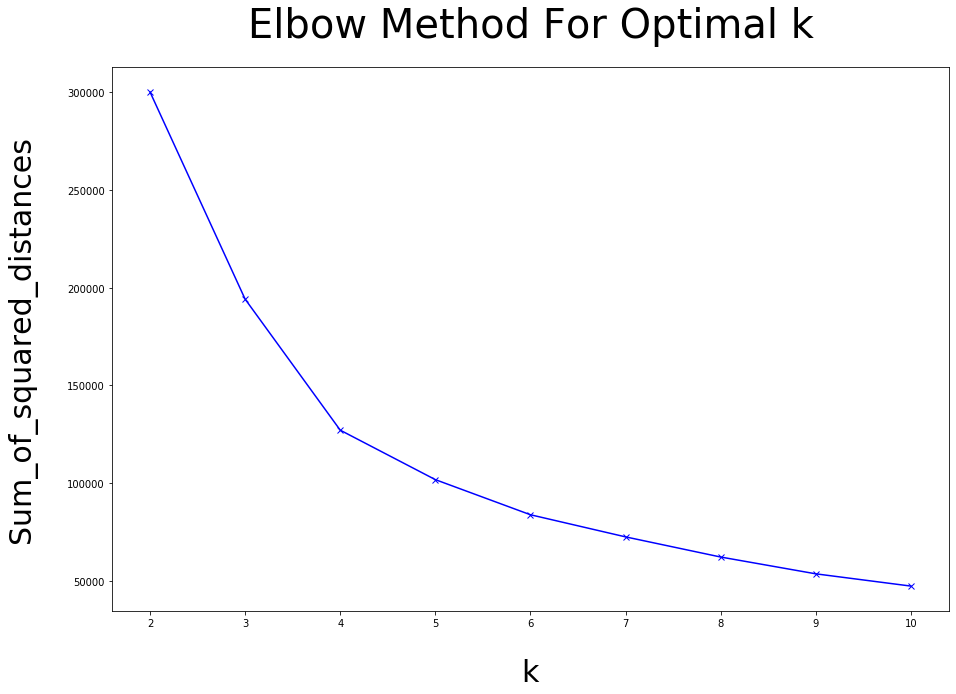

In [134]:
plt.figure(figsize=(15, 10))

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k', fontsize=30,
           labelpad=30)
plt.ylabel('Sum_of_squared_distances',
           fontsize=30,
           labelpad=30)
plt.title('Elbow Method For Optimal k',
          fontsize=40, pad=30)

plt.show()

La méthode du coude confirme que le nombre de clusters optimal se situe bien à 4.

___
###### 2.3.1.2 Méthode du coefficient moyen de silhouette

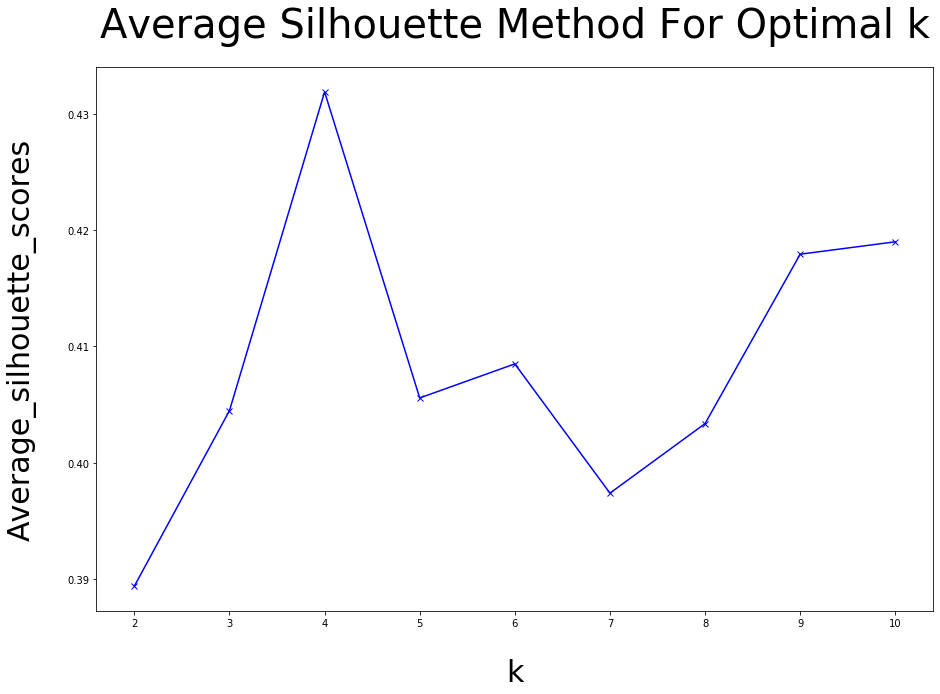

In [135]:
plt.figure(figsize=(15, 10))

plt.plot(K, Average_silhouette_scores, 'bx-')
plt.xlabel('k',
           fontsize=30,
           labelpad=30)
plt.ylabel('Average_silhouette_scores',
           fontsize=30,
           labelpad=30)
plt.title('Average Silhouette Method For Optimal k',
          fontsize=40, pad=30)
plt.show()

La méthode du coefficient moyen de Silhouette confirme que le nombre de clusters optimal se situe bien à 4.

___
###### 2.3.1.3 Tests et comparaisons sur une plage de valeurs de k

In [117]:
algos = {"KMeans-k=10": KMeans(n_clusters=10),
         "KMeans-k=9": KMeans(n_clusters=9),
         "KMeans-k=8": KMeans(n_clusters=8),
         "KMeans-k=7": KMeans(n_clusters=7),
         "KMeans-k=6": KMeans(n_clusters=6),
         "KMeans-k=5": KMeans(n_clusters=5),
         "KMeans-k=4": KMeans(n_clusters=4),
         "KMeans-k=3": KMeans(n_clusters=3)}

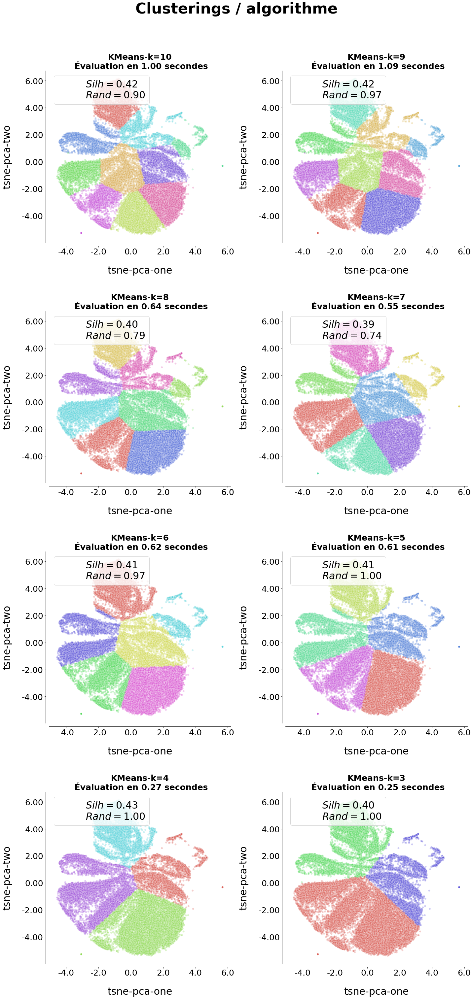

In [118]:
scores = hf.fit_plot(algos, data_model, 40, 20, "Clusterings / algorithme")

Les différents algorithmes donnent les résultats suivants :

In [119]:
scores.sort_values(["silhouette", "Rand", "Time"], ascending=False)

,Algorithme,iter,silhouette,Rand,Nb Clusters,Time
19,KMeans-k=4,1,0.431914,0.998765,4,0.267672
18,KMeans-k=4,0,0.431894,0.998599,4,0.267672
20,KMeans-k=4,2,0.431877,0.998242,4,0.267672
2,KMeans-k=10,2,0.419431,0.855828,10,0.996416
1,KMeans-k=10,1,0.419431,0.999431,10,0.996416
4,KMeans-k=9,1,0.418357,0.970691,9,1.089712
3,KMeans-k=9,0,0.418287,0.977940,9,1.089712
5,KMeans-k=9,2,0.417890,0.956633,9,1.089712
13,KMeans-k=6,1,0.409157,0.957598,6,0.617680
12,KMeans-k=6,0,0.409148,0.999375,6,0.617680


___
###### _<u>2.3.1.4 Conclusion</u>_

Les 3 itérations du clusterings à 4 clusters occupent le podium de tête, ce qui met en évidence la stabilité comme la performance du clustering.

N_CLUSTERS = 4 est donc le nombre de clusters optimal (méthode du coude + méthode du coefficient moyen de silhouette). 

In [143]:
N_CLUSTERS = 4

___
##### _<u>2.3.2 Autres paramètres</u>_

Voyons maintenant s'il est possible d'améliorer nos scores en optimisant les paramètres du KMeans via une GridSearchCV.

In [144]:
from sklearn.model_selection import GridSearchCV

parameters = [{'n_clusters': [N_CLUSTERS],
               'n_init':[5, 10, 15, 20],
               'max_iter':[100, 300, 500],
               'tol':[0.0001, 0.0003, 0.0005],
               'random_state':[42]
               }]

clf = GridSearchCV(KMeans(), parameters)

clf.fit(data_model)

GridSearchCV(cv=None, error_score=nan,
             estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++',
                              max_iter=300, n_clusters=8, n_init=10,
                              n_jobs=None, precompute_distances='auto',
                              random_state=None, tol=0.0001, verbose=0),
             iid='deprecated', n_jobs=None,
             param_grid=[{'max_iter': [100, 300, 500], 'n_clusters': [4],
                          'n_init': [5, 10, 15, 20], 'random_state': [42],
                          'tol': [0.0001, 0.0003, 0.0005]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [145]:
default_model = KMeans(n_clusters=N_CLUSTERS, random_state=42)
CV_optimized_model = KMeans(n_clusters=N_CLUSTERS, n_init=clf.best_params_["n_init"],
                            max_iter=clf.best_params_["max_iter"],
                            tol=clf.best_params_["tol"],
                            random_state=42)

In [146]:
algos = {"KMeans": default_model,
         "KMeans-CV": CV_optimized_model}

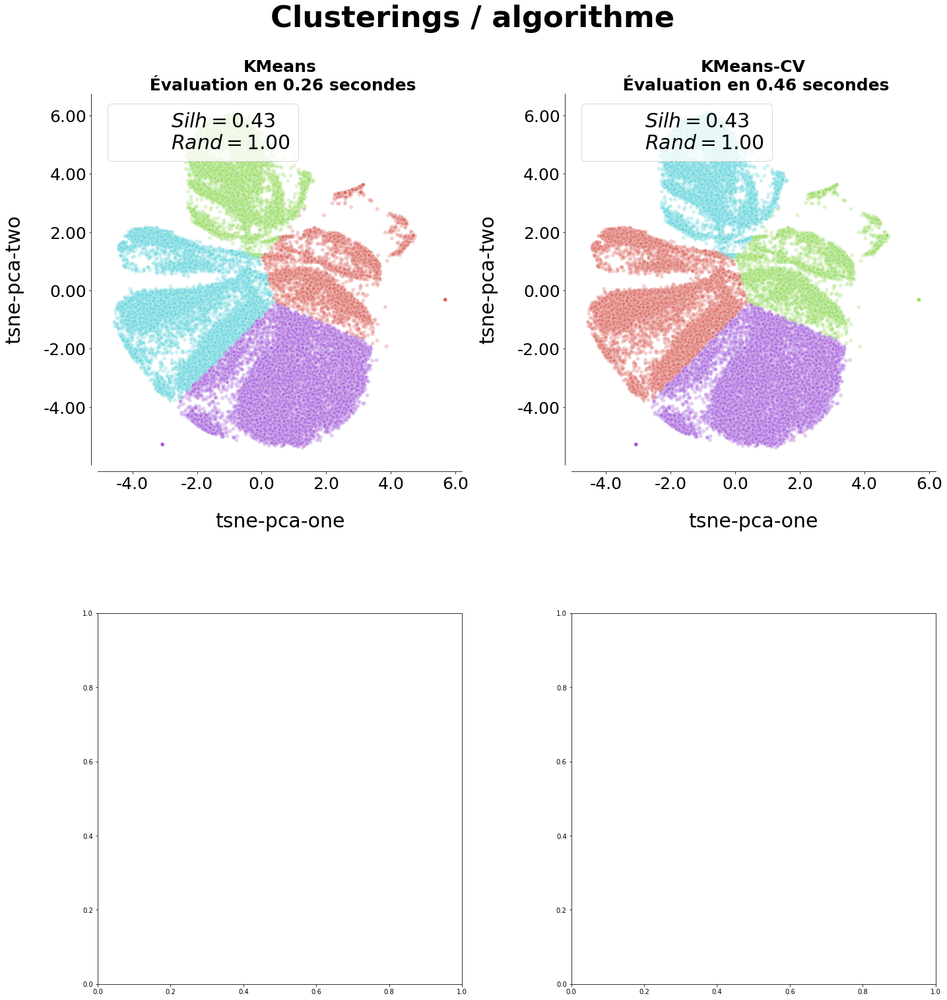

In [147]:
scores = hf.fit_plot(algos, data_model, 20, 20, "Clusterings / algorithme")

In [148]:
scores.sort_values(["silhouette", "Rand", "Time"], ascending=False)

,Algorithme,iter,silhouette,Rand,Nb Clusters,Time
3,KMeans-CV,0,0.431862,1.0,4,0.455278
4,KMeans-CV,1,0.431862,1.0,4,0.455278
5,KMeans-CV,2,0.431862,1.0,4,0.455278
0,KMeans,0,0.431844,1.0,4,0.255335
1,KMeans,1,0.431844,1.0,4,0.255335
2,KMeans,2,0.431844,1.0,4,0.255335


___
##### _<u>2.3.3 Conclusion</u>_

Le modèle obtenu avec GridSearchCV donne des résultats légèrement meilleurs que ceux obtenus avec les paramètres par défaut, mais en beaucoup plus de temps.
>**Nous utiliserons donc les paramètres par défaut.**

In [149]:
model = default_model

model.fit(data_model)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

___
#### 2.4 EXPLOITATION DU MODÈLE

___
##### _<u>2.4.1 Segmentation avec obtention des centroïdes</u>_

In [150]:
data_model["cluster"] = model.labels_

On va récupérer le profil de client type de chaque cluster en 2 étapes :
- Obtention des coordonnées des centroïdes
- Détermination des médoïdes qui seront donc les clients les plus représentatifs du cluster.

In [151]:
centroids = model.cluster_centers_

In [154]:
data_centroids = pd.DataFrame(columns=["tsne-pca-one",
                                       "tsne-pca-two",
                                       "centroids_cluster"])

data_centroids.loc[len(data_centroids)] = [centroids[0][0],
                                           centroids[0][1], "0"]
data_centroids.loc[len(data_centroids)] = [centroids[1][0],
                                           centroids[1][1], "1"]
data_centroids.loc[len(data_centroids)] = [centroids[2][0],
                                           centroids[2][1], "2"]
data_centroids.loc[len(data_centroids)] = [centroids[3][0],
                                           centroids[3][1], "3"]

Text(0, 0.5, 'PCA-t-SNE 2')

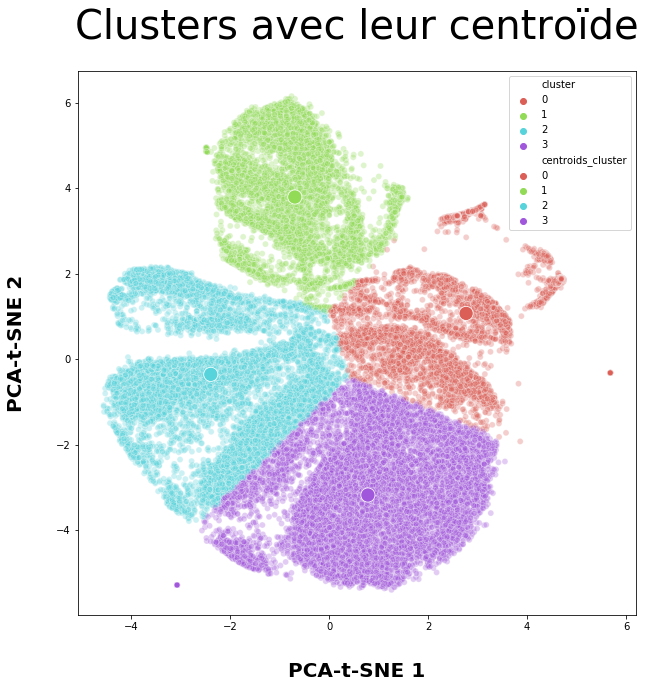

In [160]:
TITLE_SIZE = 40
TITLE_PAD = 1.05


plt.figure(figsize=(10, 10))

plt.title("Clusters avec leur centroïde",
          fontsize=TITLE_SIZE,
          y=TITLE_PAD)

handle_plot_1 = sns.scatterplot(x='tsne-pca-one', y='tsne-pca-two',
                                data=data_model, hue='cluster',
                                alpha=0.3,
                                palette=sns.color_palette("hls",
                                                          N_CLUSTERS),
                                legend="full",)

handle_plot_1.set_xlabel("PCA-t-SNE 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_1.set_ylabel("PCA-t-SNE 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")


handle_plot_2 = sns.scatterplot(x='tsne-pca-one', y='tsne-pca-two',
                                data=data_centroids, hue='centroids_cluster',
                                palette=sns.color_palette("hls", N_CLUSTERS),
                                s=200, alpha=1)

handle_plot_2.set_xlabel("PCA-t-SNE 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_2.set_ylabel("PCA-t-SNE 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

___
##### _<u>2.4.2 Détermination des médoïdes</u>_

In [161]:
closest, _ = pairwise_distances_argmin_min(model.cluster_centers_,
                                           data_model[["tsne-pca-one",
                                                       "tsne-pca-two"]])

In [162]:
data_model.iloc[list(closest)]

,tsne-pca-one,tsne-pca-two,cluster
13332,2.795015,1.072301,0
14587,-0.713884,3.793697,1
11561,-2.386097,-0.350200,2
10801,0.786268,-3.206297,3


In [163]:
CLI = [col for col in customer_data_2017 if col.startswith("CLI")]
PROD = [col for col in customer_data_2017 if col.startswith("PROD")]
hour = [col for col in data_2017 if col.endswith("hour")]
minutes = [col for col in data_2017 if col.endswith("min")]
payment_type = [col for col in data_2017 if col.startswith("payment_type")]

In [164]:
data_medoids = pd.concat([data_2017.iloc[list(closest)].drop(columns=CLI+\
                                                                     PROD+\
                                                                     hour+\
                                                                     minutes+\
                                                                     payment_type),
                          customer_data_2017.iloc[list(closest)][["payment_type",
                                                                  "customer_state",
                                                                  "customer_city",
                                                                  "product_category_name"]]], 
                         axis=1)

In [165]:
nunique = data_medoids.apply(pd.Series.nunique)

cols_to_drop = nunique[nunique == 1].index

In [166]:
data_medoids = data_medoids.drop(list(cols_to_drop), axis=1)

In [167]:
data_medoids["average_basket"] = np.exp(data_medoids["average_basket"])
data_medoids["M_score"] = np.exp(data_medoids["M_score"])
data_medoids["product_volume_cm3"] = np.exp(data_medoids["product_volume_cm3"])
data_medoids["product_weight_g"] = np.exp(data_medoids["product_weight_g"])

In [169]:
data_medoids.T.rename(columns={13332:"Cluster 0",
                               14587:"Cluster 1",
                               11561:"Cluster 2",
                               10801:"Cluster 3"})

,Cluster 0,Cluster 1,Cluster 2,Cluster 3
average_basket,131.84,81.14,120.04,94.66
freight_value,13.85,16.15,20.05,7.86
product_weight_g,1600,200,2150,422
product_volume_cm3,39375,3960,4732,3240
review_score,5,4,3,5
R_score,7,1,4,6
M_score,32,19,29,23
first_order_month,9,3,7,8
first_order_day,21,14,8,21
last_order_month,9,3,7,8


___
##### _<u>2.4.3 Profil client type par cluster</u>_

<table style="width:100%">
  <tr>
    <th>Cluster</th>
    <th>Moyens</th>
    <th>Position</th> 
    <th>Produits</th>
    <th>Satisfaction</th>
  </tr>
  <tr>
    <td>0</td>
    <td>
        <ul>
            <li>Panier moyen le plus élevé</li>
            <li>Plus gros score de montant</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème frais de port les plus faibles</li>
            <li>État de São Paulo</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>chambre-salle à manger-salle de bain</li>
            <li>Produits les plus volumineux</li>
            <li>2ème produits les plus lourds</li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
  
  <tr>
    <td>1</td>
    <td>
        <ul>
            <li>Panier moyen le plus faible</li>
            <li>Plus petit score de montant</li>
            <li>Paiement par boleto</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème plus gros frais de port</li>
            <li>État de Mato Grosso do Sul</li>
            <li>Région Centre-Ouest</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>beauté-santé</li>
            <li>2ème produits les moins volumineux</li>
            <li>Produits les moins lourds</li>
       </ul>
    </td>
    <td>Clients satisfaits</td>
  </tr>
    
  <tr>
    <td>2</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus élevé</li>
            <li>2ème score de montant le plus élevé</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>Plus gros frais de port</li>
            <li>État de Minas Gerais</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>beauté-santé</li>
            <li>2ème produits les plus volumineux</li>
            <li>Produits les plus lourds</li>
       </ul>
    </td>
    <td>Clients moyennement satisfaits</td>
  </tr>
 
  <tr>
    <td>3</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus faible</li>
            <li>2ème plus petit score de montant</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>Frais de port les plus faibles</li>
            <li>État de São Paulo</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>gadgets</li>
            <li>Produits les moins volumineux</li>
            <li>2ème produits les moins lourds</li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
</table>

- **Client type cluster 0** : 

Panier moyen le plus élevé. Achète des produits lourds et volumineux, mais vivant à São Paulo, les frais de port restent peu importants. Clients très satisfaits.

> **Very High Value Customer**

- **Cluster 1** :
Panier moyen le plus faible et ne possède pas nécessairement de compte en banque. Achète des produits légers et peu volumineux, et vit dans le Centre-Ouest, d'où des frais de port élevés. Clients satisfaits.

> **Low value customer**

- **Cluster 2** : 
> Panier moyen élevé, commande des produits lourds et volumineux bien que ne vivant pas à São Paulo = frais de port élevés. Clients moyennement satisfaits.

> **Medium Value Customer**

- **Cluster 3** :
> Panier moyen faible, commande des produits légers et peu volumineux. Vivant à São Paulo, les frais de port sont donc les plus faibles. Clients très satisfaits.

>**High Potential Customer**

___
#### 2.5 ÉTUDE DE LA FRÉQUENCE

___
##### _<u>2.5.1 Test du modèle sur les données 2018</u>_

___
###### 2.5.1.1. Réduction dimensionnelle

In [175]:
# On teste le modèle avec les clients de l'année 2018

In [176]:
N_COMPONENTS = 20

In [177]:
pca = decomposition.PCA(n_components=N_COMPONENTS)
pca_results = pca.fit_transform(data_2018_scaled)

print('Cumulative explained variation for {} principal components: {}'\
      .format(N_COMPONENTS, np.sum(pca.explained_variance_ratio_)))

Cumulative explained variation for 20 principal components: 0.826136194432097


In [178]:
time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_results)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 46387 samples in 0.073s...
[t-SNE] Computed neighbors for 46387 samples in 135.523s...
[t-SNE] Computed conditional probabilities for sample 1000 / 46387
[t-SNE] Computed conditional probabilities for sample 2000 / 46387
[t-SNE] Computed conditional probabilities for sample 3000 / 46387
[t-SNE] Computed conditional probabilities for sample 4000 / 46387
[t-SNE] Computed conditional probabilities for sample 5000 / 46387
[t-SNE] Computed conditional probabilities for sample 6000 / 46387
[t-SNE] Computed conditional probabilities for sample 7000 / 46387
[t-SNE] Computed conditional probabilities for sample 8000 / 46387
[t-SNE] Computed conditional probabilities for sample 9000 / 46387
[t-SNE] Computed conditional probabilities for sample 10000 / 46387
[t-SNE] Computed conditional probabilities for sample 11000 / 46387
[t-SNE] Computed conditional probabilities for sample 12000 / 46387
[t-SNE] Computed conditional probabilities for 

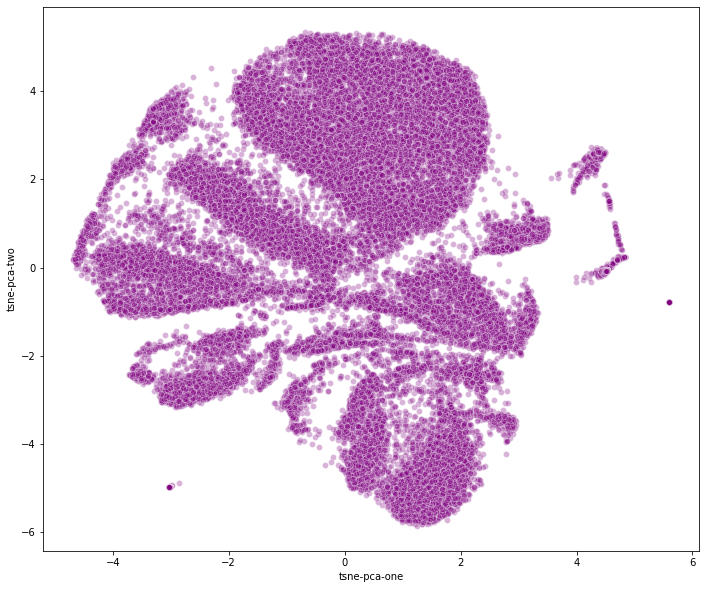

In [179]:
data_2018['tsne-pca-one'] = tsne_pca_results[:, 0]
data_2018['tsne-pca-two'] = tsne_pca_results[:, 1]

plt.figure(figsize=(40, 10))

ax3 = plt.subplot(1, 3, 3)
sns.scatterplot(
    x="tsne-pca-one", y="tsne-pca-two",
    data=data_2018,
    legend="full",
    alpha=0.3,
    ax=ax3
)

___
###### 2.5.1.2 Segmentation et détermination des médoïdes

In [180]:
data_2018["cluster_model_2017"] = model.predict(data_2018[["tsne-pca-one",
                                                           "tsne-pca-two"]])

In [181]:
closest, _ = pairwise_distances_argmin_min(model.cluster_centers_,
                                           data_2018[["tsne-pca-one",
                                                      "tsne-pca-two"]])

In [182]:
data_medoids_2018 = pd.concat([data_2018.iloc[list(closest)]\
                               .drop(columns=CLI+PROD+hour+minutes+payment_type),
                               customer_data_2018.iloc[list(closest)][["payment_type",
                                                                       "customer_state",
                                                                       "customer_city",
                                                                       "product_category_name"]]], 
                         axis=1)

In [183]:
nunique = data_medoids_2018.apply(pd.Series.nunique)

cols_to_drop = nunique[nunique == 1].index

In [184]:
data_medoids_2018 = data_medoids_2018.drop(list(cols_to_drop), axis=1)

In [185]:
data_medoids_2018["average_basket"] = np.exp(data_medoids_2018["average_basket"])
data_medoids_2018["M_score"] = np.exp(data_medoids_2018["M_score"])
data_medoids_2018["product_volume_cm3"] = np.exp(data_medoids_2018["product_volume_cm3"])
data_medoids_2018["product_weight_g"] = np.exp(data_medoids_2018["product_weight_g"])

In [190]:
data_medoids_2018.drop(columns=["tsne-pca-one",
                                "tsne-pca-two",
                                "cluster_model_2017"])\
                .T\
                .rename(columns={45546:"Cluster 0",
                                 24259:"Cluster 1",
                                 9574:"Cluster 2",
                                 46031:"Cluster 3"})

,Cluster 0,Cluster 1,Cluster 2,Cluster 3
average_basket,54.87,76.87,521.13,164.26
freight_value,13.87,8.88,25.18,34.27
product_weight_g,650,450,15300,7600
product_volume_cm3,2560,1280,12250,60000
review_score,5,4,5,5
R_score,5,3,2,1
M_score,13,18,100,39
first_order_month,7,6,4,2
first_order_day,19,8,18,14
last_order_month,7,6,4,2


___
###### 2.5.1.3 Profil client type par cluster

<table style="width:100%">
  <tr>
    <th>Cluster</th>
    <th>Moyens</th>
    <th>Position</th> 
    <th>Produits</th>
    <th>Satisfaction</th>
  </tr>
  <tr>
    <td>0</td>
    <td>
        <ul>
            <li>Panier moyen le plus faible</li>
            <li>Plus petit score de montant</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème frais de port les plus faibles</li>
            <li>État de São Paulo</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>chambre-salle à manger-salle de bain</li>
            <li>2ème produits les moins volumineux</li>
            <li>2ème produits les moins lourds</li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
  
  <tr>
    <td>1</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus faible</li>
            <li>2ème plus petit score de montant</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>Frais de port les plus faibles</li>
            <li>État de São Paulo</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>accessoires informatiques</li>
            <li>Produits les moins volumineux</li>
            <li>Produits les moins lourds</li>
       </ul>
    </td>
    <td>Clients satisfaits</td>
  </tr>
    
  <tr>
    <td>2</td>
    <td>
        <ul>
            <li>Panier moyen le plus élevé</li>
            <li>Score de montant le plus élevé</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème plus gros frais de port</li>
            <li>État de Minas Gerais</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>outils de jardin</li>
            <li>2ème produits les plus volumineux</li>
            <li>Produits les plus lourds</li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
 
  <tr>
    <td>3</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus élevé</li>
            <li>2ème plus gros score de montant</li>
            <li>Paiement par boleto</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>Frais de port les plus élevés</li>
            <li>État de Rio Grande do Sul</li>
            <li>Région du Sud</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>électroménager</li>
            <li>Produits les plus volumineux</li>
            <li>2ème produits les plus lourds</li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
</table>

- **Cluster 0** : 

Panier moyen le plus faible. Achète des produits légers et peu volumineux. Vivant à São Paulo, les frais de port sont faibles. Clients très satisfaits.

> **Low Value Customer**

- **Cluster 1** :

Panier moyen faible. Achète des produits légers et peu volumineux. Vivant à São Paulo, les frais de port sont donc les plus faibles. Clients satisfaits.

> **High Potential Customer**

- **Cluster 2** : 

Panier moyen le plus élevé, commande des produits lourds et volumineux bien que ne vivant pas à São Paulo (mais dans la même région) = frais de port élevés. Clients très satisfaits.

> **High Value Customer**

- **Cluster 3** :

Panier moyen élevé, commande des produits lourds et volumineux, bien que vivant dans la région Sud = les frais de port sont donc les plus élevés. Clients très satisfaits.

>**Medium Potential Customer**

___
##### 2.5.2 Comparaison profil client type 2017 et 2018 par cluster

CLUSTER 0

<table align="left" style="width:100%">
  <tr>
    <th>Cluster</th>
    <th>Moyens</th>
    <th>Position</th> 
    <th>Produits</th>
    <th>Satisfaction</th>
  </tr>
  <tr>
    <td>0 (2017)</td>
    <td>
        <ul>
            <li><span style="color:red">Panier moyen le plus élevé</span></li>
            <li><span style="color:red">Plus gros score de montant</span></li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème frais de port les plus faibles</li>
            <li>État de São Paulo</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>chambre-salle à manger-salle de bain</li>
            <li><span style="color:red">Produits les plus volumineux</span></li>
            <li><span style="color:red">2ème produits les plus lourds</span></li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>    
  </tr>
  
  <tr>
    <td>0 (2018)</td>
    <td>
        <ul>
            <li><span style="color:red">Panier moyen le plus faible</span></li>
            <li><span style="color:red">Plus petit score de montant</span></li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème frais de port les plus faibles</li>
            <li>État de São Paulo</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>chambre-salle à manger-salle de bain</li>
            <li><span style="color:red">2ème produits les moins volumineux</span></li>
            <li><span style="color:red">2ème produits les moins lourds</span></li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
</table>

**Classification :** 
- 2017 : <span style="color:red">High Value Customer</span>
- 2018 : <span style="color:red">Low Value Customer</span>

CLUSTER 1

<table align="left" style="width:100%">
  <tr>
    <th>Cluster</th>
    <th>Moyens</th>
    <th>Position</th> 
    <th>Produits</th>
    <th>Satisfaction</th>
  </tr>
  <tr>
    <td>1 (2017)</td>
    <td>
        <ul>
            <li>Panier moyen le plus faible</li>
            <li>Plus petit score de montant</li>
            <li><span style="color:red">Paiement par boleto</span></li>
        </ul>
    </td> 
    <td>
        <ul>
            <li><span style="color:red">2ème plus gros frais de port</span></li>
            <li><span style="color:red">État de Mato Grosso do Sul</span></li>
            <li><span style="color:red">Région Centre-Ouest</span></li>
        </ul>
    </td>
    <td>
        <ul>
            <li><span style="color:red">beauté-santé</span></li>
            <li>2ème produits les moins volumineux</li>
            <li>Produits les moins lourds</li>
       </ul>
    </td>
    <td>Clients satisfaits</td>
  </tr>
  
  <tr>
    <td>1 (2018)</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus faible</li>
            <li>2ème plus petit score de montant</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li><span style="color:red">Frais de port les plus faibles</li>
            <li><span style="color:red">État de São Paulo</span></li>
            <li><span style="color:red">Région Sud-Est</span></li>
        </ul>
    </td>
    <td>
        <ul>
            <li><span style="color:red">accessoires informatiques</span></li>
            <li>Produits les moins volumineux</li>
            <li>Produits les moins lourds</li>
       </ul>
    </td>
    <td>Clients satisfaits</td>
  </tr>
    
</table>

**Classification :** 
- 2017 : <span style="color:red">Low Value Customer</span>
- 2018 : <span style="color:red">High Potential Customer</span>

CLUSTER 2

<table align="left" style="width:100%">
  <tr>
    <th>Cluster</th>
    <th>Moyens</th>
    <th>Position</th> 
    <th>Produits</th>
    <th>Satisfaction</th>
  </tr>
  <tr>
    <td>2</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus élevé</li>
            <li>2ème score de montant le plus élevé</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>Plus gros frais de port</li>
            <li>État de Minas Gerais</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li><span style="color:red">beauté-santé</span></li>
            <li>2ème produits les plus volumineux</li>
            <li>Produits les plus lourds</li>
       </ul>
    </td>
      <td><span style="color:red">Clients moyennement satisfaits</span></td>
  </tr>
  
  <tr>
    <td>2</td>
    <td>
        <ul>
            <li>Panier moyen le plus élevé</li>
            <li>Score de montant le plus élevé</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème plus gros frais de port</li>
            <li>État de Minas Gerais</li>
            <li>Région Sud-Est</li>
        </ul>
    </td>
    <td>
        <ul>
            <li><span style="color:red">outils de jardin</span></li>
            <li>2ème produits les plus volumineux</li>
            <li>Produits les plus lourds</li>
       </ul>
    </td>
      <td><span style="color:red">Clients très satisfaits</span></td>
  </tr>
    
</table>

**Classification :** 
- 2017 : <span style="color:red">Medium Value Customer</span>
- 2018 : <span style="color:red">High Value Customer</span>

CLUSTER 3

<table align="left" style="width:100%">
  <tr>
    <th>Cluster</th>
    <th>Moyens</th>
    <th>Position</th> 
    <th>Produits</th>
    <th>Satisfaction</th>
  </tr>
  <tr>
    <td>3 (2017)</td>
    <td>
        <ul>
            <li><span style="color:red">2ème panier moyen le plus faible</span></li>
            <li><span style="color:red">2ème plus petit score de montant</span></li>
        </ul>
    </td> 
    <td>
        <ul>
            <li><span style="color:red">Frais de port les plus faibles</span></li>
            <li><span style="color:red">État de São Paulo</span></li>
            <li><span style="color:red">Région Sud-Est</span></li>
        </ul>
    </td>
    <td>
        <ul>
            <li><span style="color:red">gadgets</span></li>
            <li><span style="color:red">Produits les moins volumineux</span></li>
            <li><span style="color:red">2ème produits les moins lourds</span></li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
  
  <tr>
    <td>3 (2018)</td>
    <td>
        <ul>
            <li><span style="color:red">2ème panier moyen le plus élevé</span></li>
            <li><span style="color:red">2ème plus gros score de montant</span></li>
            <li><span style="color:red">Paiement par boleto</span></li>
        </ul>
    </td> 
    <td>
        <ul>
            <li><span style="color:red">Frais de port les plus élevés</span></li>
            <li><span style="color:red">État de Rio Grande do Sul</span></li>
            <li><span style="color:red">Région du Sud</span></li>
        </ul>
    </td>
    <td>
        <ul>
            <li><span style="color:red">électroménager</span></li>
            <li><span style="color:red">Produits les plus volumineux</span></li>
            <li><span style="color:red">2ème produits les plus lourds</span></li>
       </ul>
    </td>
    <td>Clients très satisfaits</td>
  </tr>
    
</table>

**Classification :** 
- 2017 : <span style="color:red">High Potential Customer</span>
- 2018 : <span style="color:red">Medium Customer</span>

___
##### 2.5.3 Conclusion

Le modèle ne fonctionne plus correctement pour des cliens d'une autre année.
Il faut donc le revoir tous les ans.

____
### 3. SEGMENTATION FINALE 

Maintenant que la fréquence a été établie, nous savons que pour obtenir une segmentation valable de la base clients 2018, un nouveau modèle doit être établi.

Nous allons donc maintenant utiliser l'ensemble des données pour notre segmentation finale à fournir aux équipes marketin.

___
#### 3.1 RÉDUCTION DIMENSIONNELLE : ACP puis t-SNE

In [184]:
N_COMPONENTS = 20

In [185]:
pca = decomposition.PCA(n_components=N_COMPONENTS)
pca_results = pca.fit_transform(data_scaled)

print('Cumulative explained variation for {} principal components: {}'\
      .format(N_COMPONENTS, np.sum(pca.explained_variance_ratio_)))

Cumulative explained variation for 20 principal components: 0.8165850666668821


In [186]:
time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_results)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 87470 samples in 0.152s...
[t-SNE] Computed neighbors for 87470 samples in 646.356s...
[t-SNE] Computed conditional probabilities for sample 1000 / 87470
[t-SNE] Computed conditional probabilities for sample 2000 / 87470
[t-SNE] Computed conditional probabilities for sample 3000 / 87470
[t-SNE] Computed conditional probabilities for sample 4000 / 87470
[t-SNE] Computed conditional probabilities for sample 5000 / 87470
[t-SNE] Computed conditional probabilities for sample 6000 / 87470
[t-SNE] Computed conditional probabilities for sample 7000 / 87470
[t-SNE] Computed conditional probabilities for sample 8000 / 87470
[t-SNE] Computed conditional probabilities for sample 9000 / 87470
[t-SNE] Computed conditional probabilities for sample 10000 / 87470
[t-SNE] Computed conditional probabilities for sample 11000 / 87470
[t-SNE] Computed conditional probabilities for sample 12000 / 87470
[t-SNE] Computed conditional probabilities for 

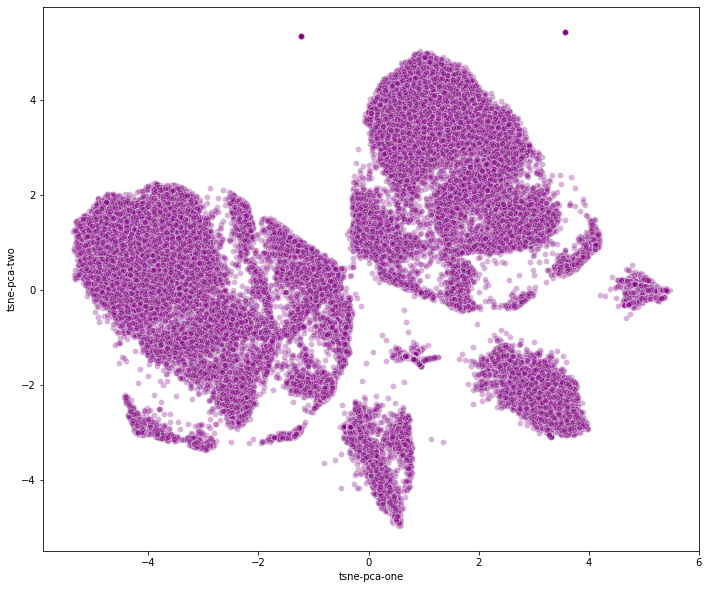

In [187]:
data['tsne-pca-one'] = tsne_pca_results[:, 0]
data['tsne-pca-two'] = tsne_pca_results[:, 1]

plt.figure(figsize=(40, 10))

ax3 = plt.subplot(1, 3, 3)
sns.scatterplot(
    x="tsne-pca-one", y="tsne-pca-two",
    data=data,
    legend="full",
    alpha=0.3,
    ax=ax3
)

___
#### 3.2 MISE EN PLACE MODÈLE

In [188]:
data_model = data[["tsne-pca-one", "tsne-pca-two"]].copy()

___
##### 3.2.1 Choix du nombre de clusters

___
###### 3.2.1.1 Dendrogramme

In [189]:
# For reproducability of the results
N = 20000
data_subset = data_model.sample(N)

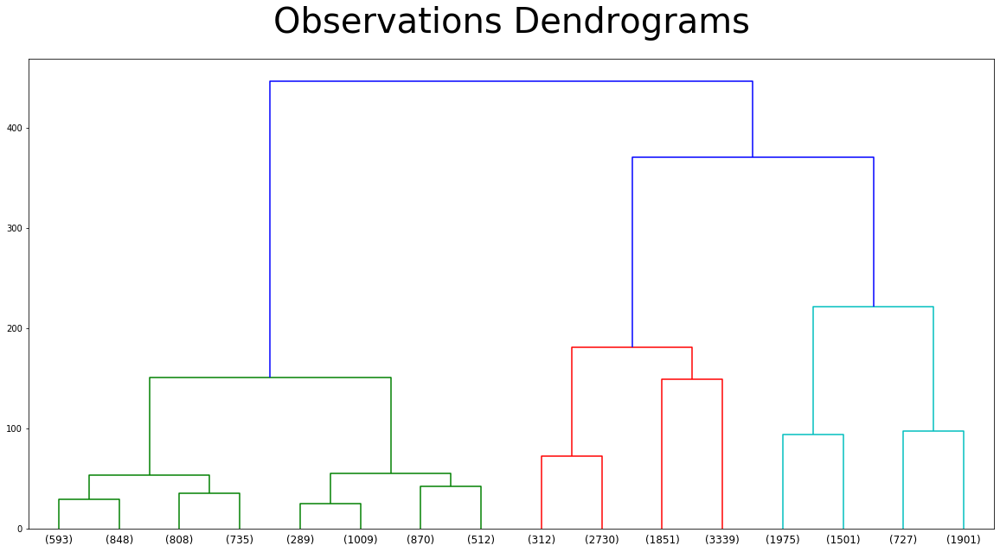

In [190]:
plt.figure(figsize=(20, 10))
plt.title("Observations Dendrograms", fontsize=40, pad=30)
dend = shc.dendrogram(shc.linkage(data_subset, method='ward'),
                      truncate_mode="level", p=3)

___
###### 3.2.1.2 Méthode du coude

In [191]:
Average_silhouette_scores = []
Sum_of_squared_distances = []

K = range(2, 11)

for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_model)

    Sum_of_squared_distances.append(km.inertia_)
    
    Average_silhouette_scores.append(silhouette_score(data_model,
                                                      km.labels_,
                                                      metric="euclidean"))

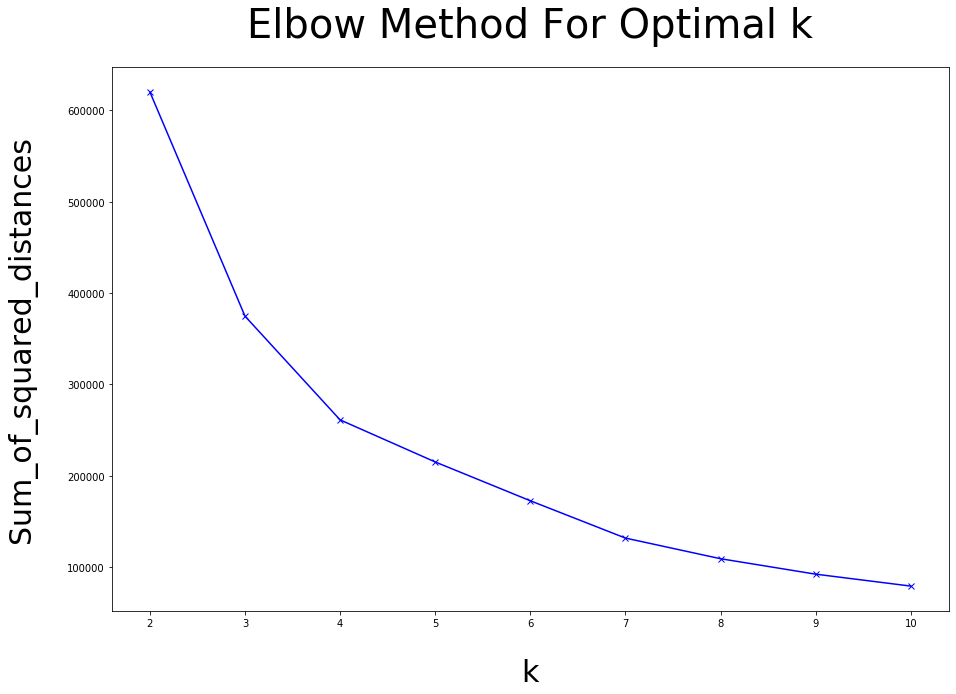

In [192]:
plt.figure(figsize=(15, 10))

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k', fontsize=30,
           labelpad=30)
plt.ylabel('Sum_of_squared_distances',
           fontsize=30,
           labelpad=30)
plt.title('Elbow Method For Optimal k',
          fontsize=40, pad=30)

plt.show()

La méthode du coefficient moyen de Silhouette confirme que le nombre de clusters optimal se situe bien à 4.

In [193]:
N_CLUSTERS = 4

___
##### 3.2.2 Optimisation des autres paramètres

In [194]:
parameters = [{'n_clusters': [N_CLUSTERS],
               'n_init':[5, 10, 15, 20],
               'max_iter':[100, 300, 500],
               'tol':[0.0001, 0.0003, 0.0005],
               'random_state':[42]
               }]

clf = GridSearchCV(KMeans(), parameters)

clf.fit(data_model)

GridSearchCV(cv=None, error_score=nan,
             estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++',
                              max_iter=300, n_clusters=8, n_init=10,
                              n_jobs=None, precompute_distances='auto',
                              random_state=None, tol=0.0001, verbose=0),
             iid='deprecated', n_jobs=None,
             param_grid=[{'max_iter': [100, 300, 500], 'n_clusters': [4],
                          'n_init': [5, 10, 15, 20], 'random_state': [42],
                          'tol': [0.0001, 0.0003, 0.0005]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [195]:
default_model = KMeans(n_clusters=N_CLUSTERS, random_state=42)
CV_optimized_model = KMeans(n_clusters=N_CLUSTERS,
                            n_init=clf.best_params_["n_init"],
                            max_iter=clf.best_params_["max_iter"],
                            tol=clf.best_params_["tol"],
                            random_state=42)

In [196]:
algos = {"KMeans": default_model,
         "KMeans-CV": CV_optimized_model}

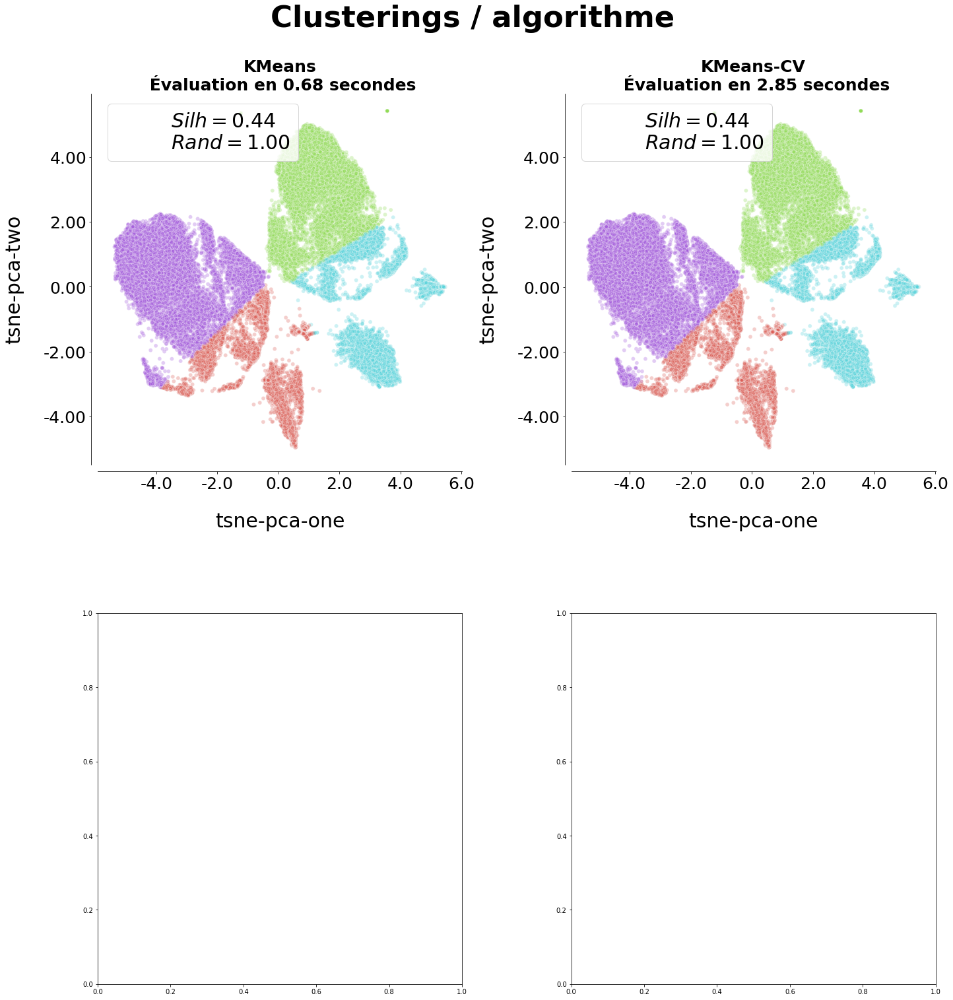

In [197]:
scores = hf.fit_plot(algos, data_model, 20, 20, "Clusterings / algorithme")

In [198]:
scores.sort_values(["silhouette", "Rand", "Time"], ascending=False)

,Algorithme,iter,silhouette,Rand,Nb Clusters,Time
3,KMeans-CV,0,0.443722,1.0,4,2.852835
4,KMeans-CV,1,0.443722,1.0,4,2.852835
5,KMeans-CV,2,0.443722,1.0,4,2.852835
0,KMeans,0,0.443721,1.0,4,0.680883
1,KMeans,1,0.443721,1.0,4,0.680883
2,KMeans,2,0.443721,1.0,4,0.680883


Le modèle obtenu avec GridSearchCV donne des résultats légèrement meilleurs que ceux obtenus avec les paramètres par défaut, et en plus de temps.
>**Nous utiliserons donc les paramètres par défaut**

___
#### 3.3 SEGMENTATION

___
##### _<u>3.3.1 Application du modèle</u>_

In [199]:
model = default_model

In [200]:
model.fit(data_model)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [201]:
data_model["cluster"] = model.labels_

___
##### _<u>3.3.2 Détermination des médoïdes</u>_

On va récupérer le profil de client type de chaque cluster en 2 étapes :
- Obtention des coordonnées des centroïdes
- Détermination des médoïdes qui seront donc les clients les plus représentatifs du cluster.

In [202]:
centroids = model.cluster_centers_

In [203]:
data_centroids = pd.DataFrame(columns=["tsne-pca-one",
                                       "tsne-pca-two",
                                       "centroids_cluster"])

data_centroids.loc[len(data_centroids)] = [centroids[0][0],
                                           centroids[0][1], "0"]
data_centroids.loc[len(data_centroids)] = [centroids[1][0],
                                           centroids[1][1], "1"]
data_centroids.loc[len(data_centroids)] = [centroids[2][0],
                                           centroids[2][1], "2"]
data_centroids.loc[len(data_centroids)] = [centroids[3][0],
                                           centroids[3][1], "3"]

Text(0, 0.5, 'PCA-t-SNE 2')

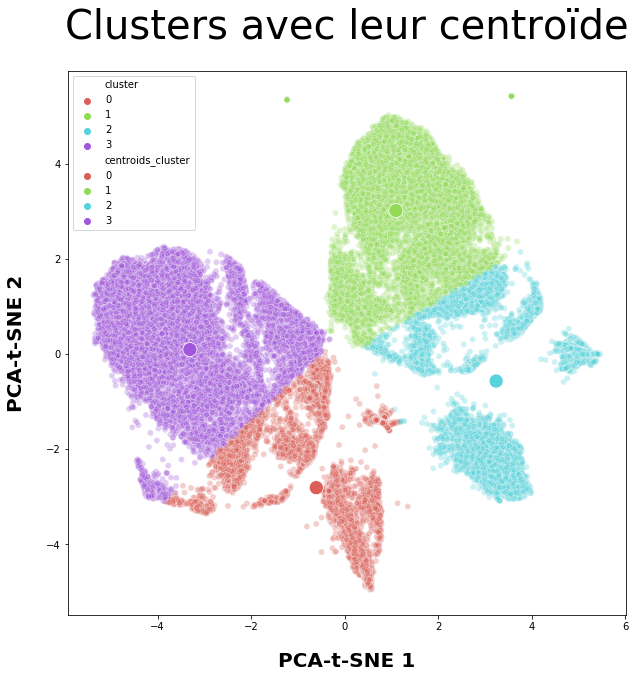

In [204]:
TITLE_SIZE = 40
TITLE_PAD = 1.05
LABEL_SIZE = 20
LABEL_PAD = 20

plt.figure(figsize=(10, 10))

plt.title("Clusters avec leur centroïde",
          fontsize=TITLE_SIZE,
          y=TITLE_PAD)

handle_plot_1 = sns.scatterplot(x='tsne-pca-one', y='tsne-pca-two',
                                data=data_model, hue='cluster',
                                alpha=0.3,
                                palette=sns.color_palette("hls",
                                                          N_CLUSTERS),
                                legend="full",)

handle_plot_1.set_xlabel("PCA-t-SNE 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_1.set_ylabel("PCA-t-SNE 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")


handle_plot_2 = sns.scatterplot(x='tsne-pca-one', y='tsne-pca-two',
                                data=data_centroids, hue='centroids_cluster',
                                palette=sns.color_palette("hls", N_CLUSTERS),
                                s=200, alpha=1)

handle_plot_2.set_xlabel("PCA-t-SNE 1",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

handle_plot_2.set_ylabel("PCA-t-SNE 2",
                         fontsize=LABEL_SIZE,
                         labelpad=LABEL_PAD,
                         fontweight="bold")

In [205]:
closest, _ = pairwise_distances_argmin_min(model.cluster_centers_,
                                           data_model[["tsne-pca-one",
                                                       "tsne-pca-two"]])

In [206]:
data_model.iloc[list(closest)]

,tsne-pca-one,tsne-pca-two,cluster
21270,-0.512517,-2.882714,0
39882,1.106680,3.017745,1
35575,2.992586,-0.110788,2
14480,-3.317298,0.071083,3


In [207]:
CLI = [col for col in customer_data_2017 if col.startswith("CLI")]
PROD = [col for col in customer_data_2017 if col.startswith("PROD")]
hour = [col for col in data_2017 if col.endswith("hour")]
minutes = [col for col in data_2017 if col.endswith("min")]
payment_type = [col for col in data_2017 if col.startswith("payment_type")]

In [208]:
data_medoids = pd.concat([data.iloc[list(closest)].drop(columns=CLI+\
                                                                PROD+\
                                                                hour+\
                                                                minutes+\
                                                                payment_type),
                          customer_data.iloc[list(closest)][["payment_type",
                                                             "customer_state",
                                                             "customer_city",
                                                             "product_category_name"]]], 
                         axis=1)

In [209]:
nunique = data_medoids.apply(pd.Series.nunique)

cols_to_drop = nunique[nunique == 1].index

In [210]:
data_medoids = data_medoids.drop(list(cols_to_drop), axis=1)

In [211]:
data_medoids["average_basket"] = np.exp(data_medoids["average_basket"])
data_medoids["M_score"] = np.exp(data_medoids["M_score"])
data_medoids["product_volume_cm3"] = np.exp(data_medoids["product_volume_cm3"])
data_medoids["product_weight_g"] = np.exp(data_medoids["product_weight_g"])

In [213]:
data_medoids.drop(columns=["tsne-pca-one",
                           "tsne-pca-two",
                           "year",
                           "first_order_year",
                           "first_order_month",
                           "first_order_day",
                           "last_order_month",
                           "last_order_year",
                           "last_order_day"])\
            .T.rename(columns={21270:"Cluster 0",
                               39882:"Cluster 1",
                               35575:"Cluster 2",
                               14480:"Cluster 3"})

,Cluster 0,Cluster 1,Cluster 2,Cluster 3
average_basket,78.18,147.65,87.64,490.99
freight_value,23.19,17.75,17.74,31.99
product_weight_g,1050,1100,950,8900
product_volume_cm3,4800,9728,23625,51975
review_score,5,4,5,3
R_score,5,1,9,6
M_score,19,35,21,100
payment_type,boleto,credit_card,credit_card,credit_card
customer_state,RJ,SP,RJ,SP
customer_city,niteroi,santo andre,itaguai,sumare


___
##### _<u>3.3.3 Profil client type par cluster</u>_

<table style="width:100%">
  <tr>
    <th>Cluster</th>
    <th>Moyens</th>
    <th>Position</th> 
    <th>Produits</th>
    <th>Satisfaction</th>
  </tr>
  <tr>
    <td>0</td>
    <td>
        <ul>
            <li>Panier moyen le plus faible</li>
            <li>Paiement par boleto</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème frais de port les plus élevés</li>
            <li>État de Rio de Janeiro (Sud-Est)</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>Chambre-salle à manger-salle de bain</li>
            <li>Produits les moins volumineux</li>
            <li>2ème produits les plus légers</li>
       </ul>
    </td>
    <td>Client très satisfait</td>
  </tr>
  
  <tr>
    <td>1</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus élevé</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>2ème plus petits frais de port</li>
            <li>État de São Paulo (Sud-Est)</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>beauté-santé</li>
            <li>2ème produits les moins volumineux</li>
            <li>2ème produits les plus lourds</li>
       </ul>
    </td>
    <td>Client satisfait</td>
  </tr>
    
  <tr>
    <td>2</td>
    <td>
        <ul>
            <li>2ème panier moyen le plus faible</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>Plus petits frais de port</li>
            <li>État de Rio de Janeiro (Sud-Est)</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>Chambre-salle à manger-salle de bain</li>
            <li>2ème produits les plus volumineux</li>
            <li>Produits les plus légers</li>
       </ul>
    </td>
    <td>Client très satisfait</td>
  </tr>
 
  <tr>
    <td>3</td>
    <td>
        <ul>
            <li>Panier le plus élevé</li>
        </ul>
    </td> 
    <td>
        <ul>
            <li>Frais de port les plus élevés</li>
            <li>État de São Paulo (Sud-Est)</li>
        </ul>
    </td>
    <td>
        <ul>
            <li>Sport-loisirs</li>
            <li>Produits les plus volumineux</li>
            <li>Produits les plus lourds</li>
       </ul>
    </td>
    <td>Clients moyennement satisfaits</td>
  </tr>
</table>

- **Client type cluster 0** : 

Panier moyen le plus faible, et ne possède pas nécessairement de compte en banque. Achète des produits légers et peu volumineux. Client très satisfait. 

> **Low Value Customer**

- **Cluster 1** :

Panier moyen élevé. Achète des produits lourds mais peu volumineux, avec des frais de port faibles. Client satisfait.

> **High Value customer**

- **Cluster 2** : 

Panier moyen faible, commande des produits volumineux mais légers. Les frais de port sont donc plus faibles. Client satisfait.

> **Medium Value Customer**

- **Cluster 3** :

Panier moyen le plus élevé, commande des produits lourds et volumineux. Frais de port les plus élevés. Client moyennement satisfait.

>**High Potential Customer**

____
### 4. CONCLUSION

Il est possible d'obtenir une segmentation correcte d'un point de vue mathématique comme marketing.

En effet, les clusters sont bien définis mais très rapprochés les uns des autres.

L'étude a également montré que le modèle doit être revu tous les ans. Cette fréquence pourrait toutefois diminuer si la base s'enrichissait de clients réguliers.